# Optimization of marketing expenses for Yandex.Afisha

<a id="cont"></a>
## Table of contents

 __[Project description](#desc)__
 <p></p>
 __[Project stages](stage)__

 * **1**. __[Data preprocessing](#id1)__
   *  _[Conclusions](#conc1)_

 * **2**. __[Make reports and calculate metrics](#id2)__

   * __[2.1. Product](#id2_1)__   
     * _[Conclusions](#conc2_1)_
    
   *  __[2.2. Sales](#id2_2)__   
     * _[Conclusions](#conc2_2)_
    
   *  __[2.3. Marketing](#id2_3)__    
     * _[Conclusions](#conc2_3)_

 * **3**. __[Advice to marketing experts how much money to invest and where](#id3)__ 

__[Overall conclusions](#id4)__

<a id=desc></a>
### Project description

Yandex.Afisha is a Russian-language market search and service for selling tickets for entertainment events. Our task is to help optimize marketing expenses.

__We have:__
 * Server logs with data on Yandex.Afisha visits from January 2017 through December 2018
 * Dump file with all orders for the period
 * Marketing expenses statistics

__We are going to study:__
 * How people use the product
 * When they start to buy
 * How much money each customer brings
 * When they pay off

<a id=stage></a>
### Project stages

___[Back to contents](#cont)___

<a id=id1></a>
### 1. Data preprocessing

*Import the libraries*

In [1]:
import pandas as pd
import numpy as np

from datetime import datetime
import calendar

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from simple_colors import *

pd.set_option('max_colwidth', 120) 
pd.set_option('display.width', 500)

#pd.options.mode.chained_assignment = None 

#import warnings 
#warnings.filterwarnings('ignore')

*Import and study the data files.*

In [2]:
visits=pd.read_csv('visits_log_us.csv')
orders=pd.read_csv('orders_log_us.csv')
costs=pd.read_csv('costs_us.csv')

visits.name='VISITS'
orders.name='ORDERS'
costs.name='COSTS'

def get_info(df):
    print('Some information about table:', df.name)
    print()
    print('INFO:')
    print()
    display(df.info(memory_usage='deep'))
    print()
    print('**********'*10)
    print()
    print('DESCRIBE:')
    display(df.describe(include='all'))
    print()
    print('**********'*10)
    print()
    print('FIRST 10 ROWS:')
    display(df.head(10))
    print()
    print('**********'*10)


get_info(visits)
get_info(orders)
get_info(costs)

Some information about table: VISITS

INFO:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 79.3 MB


None


****************************************************************************************************

DESCRIBE:


,Device,End Ts,Source Id,Start Ts,Uid
count,359400,359400,359400.000000,359400,3.594000e+05
unique,2,224760,NaN,224303,NaN
top,desktop,2017-11-24 16:51:00,NaN,2017-11-24 16:06:00,NaN
freq,262567,23,NaN,19,NaN
mean,NaN,NaN,3.750515,NaN,9.202557e+18
std,NaN,NaN,1.917116,NaN,5.298433e+18
min,NaN,NaN,1.000000,NaN,1.186350e+13
25%,NaN,NaN,3.000000,NaN,4.613407e+18
50%,NaN,NaN,4.000000,NaN,9.227413e+18
75%,NaN,NaN,5.000000,NaN,1.372824e+19



****************************************************************************************************

FIRST 10 ROWS:


,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063



****************************************************************************************************
Some information about table: ORDERS

INFO:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 4.4 MB


None


****************************************************************************************************

DESCRIBE:


,Buy Ts,Revenue,Uid
count,50415,50415.000000,5.041500e+04
unique,45991,NaN,NaN
top,2018-05-31 10:13:00,NaN,NaN
freq,9,NaN,NaN
mean,NaN,4.999647,9.098161e+18
std,NaN,21.818359,5.285742e+18
min,NaN,0.000000,3.135781e+14
25%,NaN,1.220000,4.533567e+18
50%,NaN,2.500000,9.102274e+18
75%,NaN,4.890000,1.368290e+19



****************************************************************************************************

FIRST 10 ROWS:


,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
5,2017-06-01 08:43:00,0.18,10402394430196413321
6,2017-06-01 08:54:00,1.83,12464626743129688638
7,2017-06-01 09:22:00,1.22,3644482766749211722
8,2017-06-01 09:22:00,3.30,17542070709969841479
9,2017-06-01 09:23:00,0.37,1074355127080856382



****************************************************************************************************
Some information about table: COSTS

INFO:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 206.2 KB


None


****************************************************************************************************

DESCRIBE:


,source_id,dt,costs
count,2542.000000,2542,2542.000000
unique,NaN,364,NaN
top,NaN,2017-06-10,NaN
freq,NaN,7,NaN
mean,4.857199,NaN,129.477427
std,3.181581,NaN,156.296628
min,1.000000,NaN,0.540000
25%,2.000000,NaN,21.945000
50%,4.000000,NaN,77.295000
75%,9.000000,NaN,170.065000



****************************************************************************************************

FIRST 10 ROWS:


,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08
5,1,2017-06-06,40.39
6,1,2017-06-07,40.59
7,1,2017-06-08,56.63
8,1,2017-06-09,40.16
9,1,2017-06-10,43.24



****************************************************************************************************


*(!) As we can see in each table, we need to change the datatype to optimize memory and improve performance:*
- for `Device` (**visits** table) from *object* to *category*;
- for `End Ts`, `Stert TS` (**visits** table), `Buy Ts` (**orders** table), `dt` (**costs** table) from *object* to *datetime*;

*Also I want to rename columns names using "_" instead " ". And make them lowercase.*

In [3]:
visits.columns=visits.columns.str.replace(' ','_').str.lower()
visits['device']=visits['device'].astype('category')
visits['end_ts']=pd.to_datetime(visits['end_ts'], format="%Y-%m-%d %H:%M")
visits['start_ts']=pd.to_datetime(visits['start_ts'], format="%Y-%m-%d %H:%M")

visits.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  category      
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int64         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint64        
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB


In [4]:
orders.columns=orders.columns.str.replace(' ','_').str.lower()
orders['buy_ts']=pd.to_datetime(orders['buy_ts'], format="%Y-%m-%d %H:%M")

orders.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   buy_ts   50415 non-null  datetime64[ns]
 1   revenue  50415 non-null  float64       
 2   uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [5]:
costs['dt']=pd.to_datetime(costs['dt'], format="%Y-%m-%d %H:%M")

costs.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


*(!) Before making calculations I will check:*
- *column `revenue` (**orders**) because there are 0 values in the column.*
- *day_time of first visit with day_time of first purchase. Because if the latter is less than the former, it is probably a bug. And for such cases, it is be better to use the first day_time of purchases as the first day_time of the visit.*  
- *source_id for all three tables.*
- *source_id for users, because one user can come from several sources. But for analysis it's better to use only one source_id (for example, the most frequent one).*

*`revenue` (**orders**)* 

In [6]:
print('There are {} ({:.2%}) of "0" values in the column revenue.'.format(orders[orders['revenue'] == 0]['revenue'].count(), orders[orders['revenue'] == 0]['revenue'].count() / len(orders) ))

There are 51 (0.10%) of "0" values in the column revenue.


*(!) That is less than 1%, we can drop it.*

In [7]:
orders=orders[orders['revenue'] !=0]

*`day_time` of first visit and `day_time` of first purchase*

In [8]:
min_visit_date=visits.groupby('uid')['start_ts'].min().reset_index()
min_order_date=orders.groupby('uid')['buy_ts'].min().reset_index()
actual_first_date=min_visit_date.merge(min_order_date, on=['uid'], how='left')
actual_first_date[actual_first_date['buy_ts']<actual_first_date['start_ts']]

,uid,start_ts,buy_ts


*(!) With dates everything is OK. Let's check `source_id`*

In [9]:
visits['source_id'].value_counts()

4     101794
3      85610
5      66905
2      47626
1      34121
9      13277
10     10025
7         36
6          6
Name: source_id, dtype: int64

In [10]:
costs['source_id'].value_counts()

5     364
9     363
3     363
1     363
10    363
4     363
2     363
Name: source_id, dtype: int64

*(!)Since, in the **costs** table there is no `source_id` **6** and **7**, and the number of rows with such `source_id` in **visit** table is small, I'll delete them from the **visit** table.*

In [11]:
visits=visits.query('(source_id != 6) and (source_id != 7)')
visits['source_id'].value_counts()

4     101794
3      85610
5      66905
2      47626
1      34121
9      13277
10     10025
Name: source_id, dtype: int64

*(!) Now, time to check `source_id` for visitors.*

In [12]:
visits.groupby('uid').agg({'source_id':'nunique'}).reset_index().query('source_id > 1')['uid'].count()

37715

In [13]:
real_source_id=visits.groupby('uid').agg({'source_id':lambda x: x.value_counts(dropna=False).index[0]}).reset_index()
real_source_id.head()

,uid,source_id
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
3,313578113262317,2
4,325320750514679,5


In [14]:
real_source_id.columns=['uid','real_source_id']
visits_new=visits.merge(real_source_id, on='uid',how='left')
visits_new.head()

,device,end_ts,source_id,start_ts,uid,real_source_id
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,4
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,5
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,9
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,3


In [15]:
visits_new.groupby('uid').agg({'real_source_id':'nunique'}).reset_index().query('real_source_id > 1')['uid'].count()

0

*(!) Now it's time to do the next steps.*

<a id=conc1></a>
***Conclusions***

Our Dataset consists of three tables with information about Yandex.Afisha visits from July 2017 to June 2018, orders for this period, and marketing expenses. 

In general, the data in these tables is good. But, of cource, before analysis it was prepared:
- datatype was changed for columns with dates;
- datatype was changed for column with just a few unique values;
- unnecessary rows (less than 1% of the data) were removed from `visits` and `orders` tables;
- *source_id* in `visits` was fixed for users with more than one source_id.

After all the manipulations, the tables become smaller and the data is ready for analysis.

___[Back to contents](#cont)___

<a id=id2></a>
### Step 2. Make reports and calculate metrics

<a id=id2_1></a>
**2.1.**   **PRODUCT**

***1.*** Let's check, how many people use it every day, week, and month.

***DAU:***

In [16]:
visits_new['visit_date']=visits_new['start_ts'].dt.date
visits_new['visit_week']=visits_new['start_ts'].dt.isocalendar().week
visits_new['visit_year']=visits_new['start_ts'].dt.year
visits_new['visit_year_month']=visits_new['start_ts'].dt.to_period("M")

dau=visits_new.groupby('visit_date').agg({'uid':'nunique'}).reset_index()
fig_dau=px.line(dau, x='visit_date', y='uid')
fig_dau.update_layout(title='Daily active users of Yandex.Afisha, 2017-2018.',
                   xaxis_title='Period',
                   yaxis_title='Number of users')
fig_dau.show()

max_dau=dau['uid'].max()
min_dau=dau['uid'].min()
print('The average naumber of daily active users: '+ black('{:.1f}'.format(dau['uid'].mean()),'bold'))
print()
print('The maximum number of daily active users ' + green('{}'.format(max_dau), 'bold') + ' was on ' 
      + black(dau['visit_date'][dau.query('uid == @max_dau').index[0]].strftime("%Y-%m-%d"), 'bold'))
print()
print('The minimum number of daily active users ' + red('{}'.format(min_dau), 'bold') + ' was on ' 
      + black(dau['visit_date'][dau.query('uid == @min_dau').index[0]].strftime("%Y-%m-%d"), 'bold'))

The average naumber of daily active users: 907.9

The maximum number of daily active users 3319 was on 2017-11-24

The minimum number of daily active users 1 was on 2018-03-31


***WAU:***

In [17]:
wau=visits_new.groupby(['visit_year', 'visit_week']).agg({'uid':'nunique'}).reset_index()

fig_wau=px.line(wau, x='visit_week', y='uid', color='visit_year')
fig_wau.update_layout(title='Weekly active users of Yandex.Afisha, 2017-2018.',
                   xaxis_title='Period,week number',
                   yaxis_title='Number of users')
fig_wau.show()

max_wau=wau['uid'].max()
min_wau=wau['uid'].min()
print('The average number of weekly active users: '+black('{:.1f}'.format(wau['uid'].mean()),'bold'))
print()
print('The maximum number of weekly active users ' + green('{}'.format(max_wau), 'bold') + ' was on ' 
      + black('{} week of {} year.'.format(int(wau.query('uid == @max_wau')['visit_week']),
                                           int(wau.query('uid == @max_wau')['visit_year'])), 'bold'))
print()
print('The minimum number of weekly active users ' + red('{}'.format(min_wau), 'bold') + ' was on ' 
      + black('{} week of {} year'.format(int(wau.query('uid == @min_wau')['visit_week']),
                                         int(wau.query('uid == @min_wau')['visit_year'])), 'bold'))

The average number of weekly active users: 5715.5

The maximum number of weekly active users 10586 was on 47 week of 2017 year.

The minimum number of weekly active users 2021 was on 22 week of 2017 year


***MAU:***

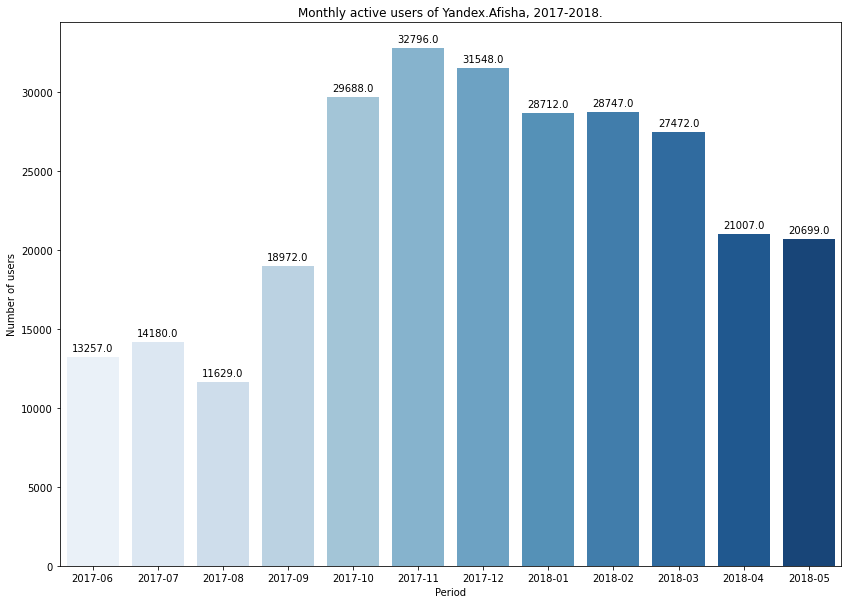

The average namber of monthly active users: 23225.6

The maximum number of monthly active users 32796 was on 2017-11

The minimum number of monthly active users 11629 was on 2017-08


In [18]:
mau=visits_new.groupby('visit_year_month').agg({'uid':'nunique'}).reset_index()

plt.figure(figsize=(14,10))

splot= sns.barplot(x='visit_year_month', y='uid', data=mau, palette="Blues")


plt.title('Monthly active users of Yandex.Afisha, 2017-2018.')
plt.ylabel("Number of users")
plt.xlabel('Period')


for p in splot.patches:
    splot.annotate(format(p.get_height(),'.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

plt.show()

max_mau=mau['uid'].max()
min_mau=mau['uid'].min()
print('The average namber of monthly active users: '+ black('{:.1f}'.format(mau['uid'].mean()),'bold'))
print()
print('The maximum number of monthly active users ' + green('{}'.format(max_mau), 'bold') + ' was on ' 
      + black(pd.Period.strftime(mau['visit_year_month'][mau.query('uid == @max_mau').index[0]], "%Y-%m"), 'bold'))
print()
print('The minimum number of monthly active users ' + red('{}'.format(min_mau), 'bold') + ' was on ' 
      + black(pd.Period.strftime(mau['visit_year_month'][mau.query('uid == @min_mau').index[0]], "%Y-%m"), 'bold'))


***2.*** Let's check, how many sessions are there per day. (One user might have more than one session.)

In [19]:
sessions_per_day=visits_new.groupby('visit_date').agg({'uid':['count', 'nunique']}).reset_index()
sessions_per_day.columns=['visit_date','number_sessions','uniq_users']
sessions_per_day['sessions_per_user']=sessions_per_day['number_sessions'] / sessions_per_day['uniq_users']
sessions_per_day.head(10)

,visit_date,number_sessions,uniq_users,sessions_per_user
0,2017-06-01,664,605,1.097521
1,2017-06-02,658,608,1.082237
2,2017-06-03,477,445,1.071910
3,2017-06-04,510,476,1.071429
4,2017-06-05,893,820,1.089024
5,2017-06-06,874,796,1.097990
6,2017-06-07,788,699,1.127325
7,2017-06-08,939,868,1.081797
8,2017-06-09,755,695,1.086331
9,2017-06-10,375,350,1.071429


*(!) Let's plot a graph with number of sessions and unique users per day.*

In [20]:
fig = go.Figure(data=[go.Scatter(x=sessions_per_day['visit_date'], y=sessions_per_day['number_sessions'], 
                                 name='Number of sessions'),
                      go.Scatter(x=sessions_per_day['visit_date'], y= sessions_per_day['uniq_users'], 
                                 name = 'Number of users')]
                      )

fig.update_layout(title='Average number of sessions and users per day',
                   xaxis_title='Period',
                   yaxis_title='Number of sessions/users')

fig.show()

print('The average number of sessions per day:', blue(round(sessions_per_day['number_sessions'].mean()), 'bold'))
print('The average number of sessions per user per day:', blue(round(sessions_per_day['sessions_per_user'].mean(), 2), 'bold'))

The average number of sessions per day: 987
The average number of sessions per user per day: 1.08


*(!) Let's check the number of sessions for different devices.*

In [21]:
device_name=['touch', 'desktop']

sess_per_day=visits_new.groupby(['device','visit_date']).agg({'uid':['count', 'nunique']}).reset_index()
sess_per_day.columns=['device','visit_date','number_sessions','uniq_users']
sess_per_day['sessions_per_user']=sess_per_day['number_sessions'] / sess_per_day['uniq_users']
   
def sess_per_day_device(device):
    device_name=device    
    print()
    print('The average number of sessions per day:', blue(round(sess_per_day.query('device==@device_name')['number_sessions'].mean()), 'bold'))
    print('The average number of sessions per user per day:', blue(round(sess_per_day.query('device==@device_name')['sessions_per_user'].mean(), 2), 'bold'))
    
    
for name in device_name:
    print()
    print(black(name, 'bold'))
    
    sess_per_day_device(name)


touch

The average number of sessions per day: 266
The average number of sessions per user per day: 1.05

desktop

The average number of sessions per day: 721
The average number of sessions per user per day: 1.09


In [22]:
fig = go.Figure(data=[go.Scatter(x=sessions_per_day['visit_date'], y=sessions_per_day['number_sessions'], 
                                 name='Number of sessions, total'),
                      go.Scatter(x=sess_per_day.query('device=="touch"')['visit_date'], y=sess_per_day.query('device=="touch"')['number_sessions'], 
                                 name='Number of sessions, touch'),
                      go.Scatter(x=sess_per_day.query('device=="desktop"')['visit_date'], y=sess_per_day.query('device=="desktop"')['number_sessions'], 
                                 name='Number of sessions, desctop')
                     ]
                      )


fig.update_layout(title='Average number of sessions by devices',
                   xaxis_title='Period',
                   yaxis_title='Number of sessions')

fig.show()

***3.*** Let's check the length of each session.

In [23]:
visits_new['session_duration_sec'] = (visits_new['end_ts'] - visits_new['start_ts']).dt.seconds
visits_new['session_duration_sec'].describe()

count    359358.000000
mean        643.498049
std        1016.309440
min           0.000000
25%         120.000000
50%         300.000000
75%         840.000000
max       84480.000000
Name: session_duration_sec, dtype: float64

*(!)Since there are minimum session duration is **0** and maximum is **84480** I want to check the outliers and number of such durations before plotting the graphs.*

In [24]:
Q1_sec=visits_new['session_duration_sec'].quantile(.25)
Q3_sec=visits_new['session_duration_sec'].quantile(.75)
IQR_sec=Q3_sec-Q1_sec
out_up_sec=Q3_sec+1.5*IQR_sec

print('The upper limit of the outliers is:', blue(out_up_sec, 'bold'))
print('The number of the outliers is: ' + blue('{} ({:.2%}).'
                                               .format(visits_new.query('session_duration_sec > @out_up_sec')['session_duration_sec'].count(),
                                                visits_new.query('session_duration_sec > @out_up_sec')['session_duration_sec'].count() / len(visits_new['session_duration_sec']) ), 'bold'))
print('The number of 0 in the column is: ' + blue('{} ({:.2%})'
                                                  .format(visits_new.query('session_duration_sec ==0')['session_duration_sec'].count(),
                                                    visits_new.query('session_duration_sec ==0')['session_duration_sec'].count() / len(visits_new['session_duration_sec']) ),'bold'))
print()
print('The number of sessions with 0 duration on the '+ black('desktop: ','bold') + blue(visits_new.query('(session_duration_sec == 0) and (device == "desktop")')['device'].count(), 'bold')
     + ' or ' + blue('{:.2%}'.format(visits_new.query('(session_duration_sec == 0) and (device == "desktop")')['device']
                                     .count() / visits_new.query('session_duration_sec == 0')['device'].count()), 'bold') + ' of 0 values.')
print('The number of sessions with 0 duration on the '+ black('touch: ','bold') + blue(visits_new.query('(session_duration_sec == 0) and (device == "touch")')['device'].count(), 'bold')
     + ' or ' + blue('{:.2%}'.format(1 - (visits_new.query('(session_duration_sec == 0) and (device == "desktop")')['device']
                                     .count() / visits_new.query('session_duration_sec == 0')['device'].count())), 'bold') + ' of 0 values.')

print()

print('The number of sessions with  duration more than 1920 sec on the '+ black('desktop: ','bold') + blue(visits_new.query('(session_duration_sec > @out_up_sec) and (device == "desktop")')['device'].count(), 'bold')
     + ' or ' + blue('{:.2%}'.format(visits_new.query('(session_duration_sec > @ out_up_sec) and (device == "desktop")')['device']
                                     .count() / visits_new.query('session_duration_sec > @ out_up_sec')['device'].count()), 'bold') + ' of outliers.')
print('The number of sessions with  duration more than 1920 sec on the '+ black('touch: ','bold') + blue(visits_new.query('(session_duration_sec > @out_up_sec) and (device == "touch")')['device'].count(), 'bold')
     + ' or ' + blue('{:.2%}'.format(1 - (visits_new.query('(session_duration_sec > @ out_up_sec) and (device == "desktop")')['device']
                                     .count() / visits_new.query('session_duration_sec > @ out_up_sec')['device'].count())), 'bold') + ' of outliers.')

The upper limit of the outliers is: 1920.0
The number of the outliers is: 24655 (6.86%).
The number of 0 in the column is: 35792 (9.96%)

The number of sessions with 0 duration on the desktop: 23688 or 66.18% of 0 values.
The number of sessions with 0 duration on the touch: 12104 or 33.82% of 0 values.

The number of sessions with  duration more than 1920 sec on the desktop: 20938 or 84.92% of outliers.
The number of sessions with  duration more than 1920 sec on the touch: 3717 or 15.08% of outliers.


*(!) Let's plot the graph with mean session duration per day by devices.*

In [25]:
sess_avg=visits_new.groupby('visit_date').agg({'session_duration_sec': 'mean'}).reset_index()
sess_avg_device=visits_new.groupby(['device', 'visit_date']).agg({'session_duration_sec': 'mean'}).reset_index()




fig = go.Figure(data=[go.Scatter(x=sess_avg['visit_date'], y=sess_avg['session_duration_sec'], 
                                 name='Average session duration, total'),
                      go.Scatter(x=sess_avg_device.query('device=="touch"')['visit_date'], y=sess_avg_device.query('device=="touch"')['session_duration_sec'], 
                                 name='Average session duration, touch'),
                      go.Scatter(x=sess_avg_device.query('device=="desktop"')['visit_date'], y=sess_avg_device.query('device=="desktop"')['session_duration_sec'], 
                                 name='Average session duration, desctop')
                     ]
                      )

fig.update_layout(title='Average session duration by devices',
                   xaxis_title='Period',
                   yaxis_title='Seconds')

fig.show()


print('The average session duration in seconds:', blue(round(visits_new['session_duration_sec'].mean()), 'bold' ))
print('The average session duration in seconds, on touch:', blue(round(visits_new.query('device =="touch"')['session_duration_sec'].mean()), 'bold' ))
print('The average session duration in seconds, on desktop:', blue(round(visits_new.query('device =="desktop"')['session_duration_sec'].mean()), 'bold' ))



The average session duration in seconds: 643
The average session duration in seconds, on touch: 480
The average session duration in seconds, on desktop: 704


In [26]:
fig = px.histogram(visits_new, x="session_duration_sec", nbins=100)
fig.update_layout(title='Distribution chart for session length',
                   xaxis_title='Session lenth, sec',
                   yaxis_title='Frequency')

fig.show()



*(!) As we can see from the graph, our data is skewed to the right. There are outliers. But the huge amount of `session_lenth` is less than 2000 sec. In such a case, it is better to use **median** and **mode** to calculate the typical value.*

In [27]:
print('The typical ' +black('session lenth', 'bold')+ ' is '+ blue('{:.1f}'.format(visits_new['session_duration_sec'].median()), 'bold'))
print('The most '+black('frequent','bold')+ ' session lenth is ' + blue('{}'.format(visits_new['session_duration_sec'].mode().loc[0]),'bold'))

The typical session lenth is 300.0
The most frequent session lenth is 60


***4.*** Let's check, how often do users come back.

*(!) Now we can calculate the retention. I want to calculate both by monthly cohorts and by source.*

In [28]:
first_visit_date = visits_new.groupby(['uid'])['visit_date'].min().reset_index()
first_visit_date.columns=['uid','first_visit_date']
retention_data=visits_new.merge(first_visit_date, on='uid',how='left')
retention_data['visit_month']=retention_data['visit_date'].astype('datetime64[M]')
retention_data['first_visit_month']=retention_data['first_visit_date'].astype('datetime64[M]')
retention_data['cohort_lifetime'] = ((retention_data['visit_month'] - retention_data['first_visit_month']) / np.timedelta64(1, 'M') ).round().astype(int)

retention_data.head()

,device,end_ts,source_id,start_ts,uid,real_source_id,visit_date,visit_week,visit_year,visit_year_month,session_duration_sec,first_visit_date,visit_month,first_visit_month,cohort_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,4,2017-12-20,51,2017,2017-12,1080,2017-12-20,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2,2018-02-19,8,2018,2018-02,1680,2018-02-19,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,5,2017-07-01,26,2017,2017-07,0,2017-07-01,2017-07-01,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,9,2018-05-20,20,2018,2018-05,1440,2018-03-09,2018-05-01,2018-03-01,2
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,3,2017-12-27,52,2017,2017-12,0,2017-12-27,2017-12-01,2017-12-01,0


***Retention by cohorts***

In [29]:
cohorts = retention_data.groupby(['first_visit_month','cohort_lifetime']).agg({'uid':'nunique'}).reset_index() 
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_visit_month','uid']]
initial_users_count = initial_users_count.rename(columns={'uid':'cohort_users'})
cohorts = cohorts.merge(initial_users_count,on='first_visit_month') 
cohorts['retention'] = cohorts['uid']/cohorts['cohort_users']
cohorts.head()

,first_visit_month,cohort_lifetime,uid,cohort_users,retention
0,2017-06-01,0,13257,13257,1.000000
1,2017-06-01,1,1043,13257,0.078675
2,2017-06-01,2,712,13257,0.053707
3,2017-06-01,3,814,13257,0.061402
4,2017-06-01,4,909,13257,0.068568


In [30]:
retention_pivot = cohorts.pivot_table(index='first_visit_month',columns='cohort_lifetime',values='retention',aggfunc='sum')
retention_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_visit_month,,,,,,,,,,,,
2017-06-01,1.0,0.078675,0.053707,0.061402,0.068568,0.071434,0.061024,0.057781,0.052350,0.050841,0.040658,0.044957
2017-07-01,1.0,0.056101,0.051305,0.056177,0.058232,0.048185,0.045368,0.045749,0.038822,0.028621,0.027480,NaN
2017-08-01,1.0,0.076817,0.062868,0.062770,0.050098,0.044008,0.036346,0.039489,0.027898,0.026031,NaN,NaN
2017-09-01,1.0,0.085499,0.069213,0.050712,0.039396,0.037840,0.035864,0.024189,0.022812,NaN,NaN,NaN
2017-10-01,1.0,0.078620,0.052247,0.038925,0.034266,0.032226,0.021368,0.020367,NaN,NaN,NaN,NaN
2017-11-01,1.0,0.078284,0.044115,0.038683,0.033728,0.023415,0.021801,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.0,0.055822,0.037967,0.031118,0.020270,0.019043,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.0,0.059723,0.039344,0.024977,0.020247,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.0,0.057082,0.025455,0.020094,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


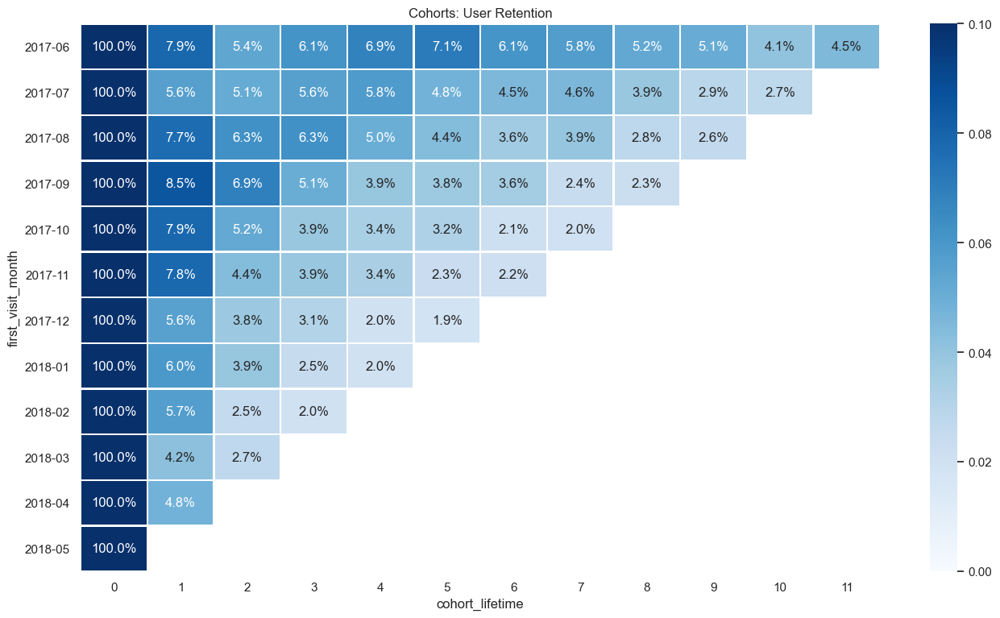

In [31]:
sns.set(style='white')
fig, axes = plt.subplots(1, 1, figsize=(16, 9), dpi=100)
plt.title('Cohorts: User Retention')
axes = sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, cmap="Blues", vmin=0, vmax=0.1)  #  YlGnBu YlOrBr
axes.set_yticklabels(retention_pivot.index.strftime('%Y-%m'))
plt.show()

***Retention by sources***

In [32]:
sources = retention_data.groupby(['real_source_id','cohort_lifetime']).agg({'uid':'nunique'}).reset_index() 
initial_users_count_s = sources[sources['cohort_lifetime'] == 0][['real_source_id','uid']]
initial_users_count_s = initial_users_count_s.rename(columns={'uid':'source_users'})
sources = sources.merge(initial_users_count_s,on='real_source_id') 
sources['retention'] = sources['uid']/sources['source_users']
sources.head()

,real_source_id,cohort_lifetime,uid,source_users,retention
0,1,0,10714,10714,1.000000
1,1,1,1055,10714,0.098469
2,1,2,523,10714,0.048815
3,1,3,422,10714,0.039388
4,1,4,341,10714,0.031828


In [33]:
retention_pivot_s = sources.pivot_table(index='real_source_id',columns='cohort_lifetime',values='retention',aggfunc='sum')
retention_pivot_s

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
real_source_id,,,,,,,,,,,,
1,1.0,0.098469,0.048815,0.039388,0.031828,0.026787,0.019227,0.016427,0.012040,0.008867,0.006720,0.004760
2,1.0,0.122413,0.077950,0.065864,0.053880,0.043205,0.036306,0.026890,0.020494,0.014502,0.010726,0.007050
3,1.0,0.060023,0.038112,0.029866,0.024461,0.019245,0.014525,0.011218,0.007416,0.004983,0.003642,0.002273
4,1.0,0.046081,0.030123,0.025312,0.020455,0.017542,0.012895,0.009593,0.006664,0.004901,0.002988,0.002077
5,1.0,0.040377,0.023929,0.016922,0.013129,0.011563,0.008554,0.006843,0.004143,0.002659,0.001814,0.001154
9,1.0,0.125968,0.100774,0.071635,0.064501,0.052815,0.038246,0.030202,0.022917,0.017605,0.009865,0.006526
10,1.0,0.048600,0.026694,0.019295,0.014507,0.009720,0.010010,0.007109,0.003772,0.002466,0.001741,0.001596


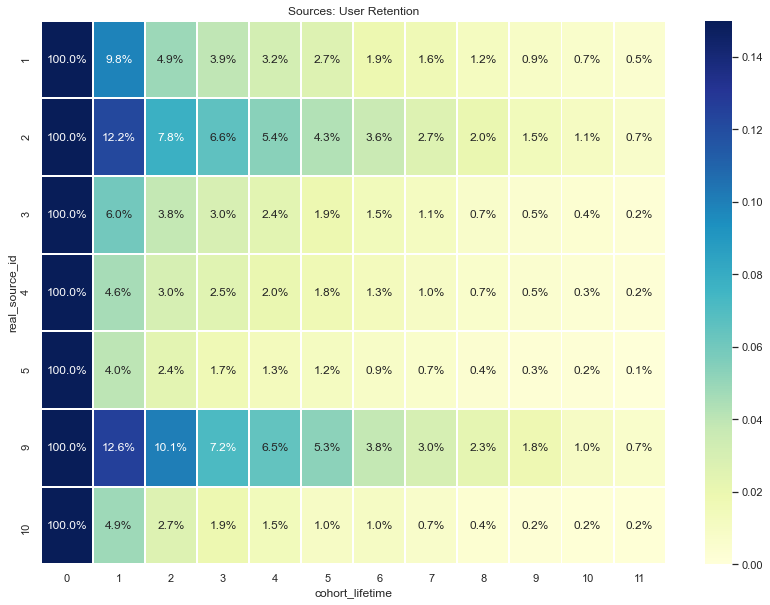

In [34]:
sns.set(style='white')
plt.figure(figsize=(14,10))
plt.title('Sources: User Retention')
sns.heatmap(retention_pivot_s, annot=True, fmt='.1%', linewidths=1, cmap="YlGnBu", vmin=0, vmax=0.15)  #  YlOrBr Blues
plt.show()

<a id=conc2_1></a>
***Conclusions***

**1.** How many people use it every day, week, and month?
1. The *average* number of `daily active users` is ***908***; *minimum* number - ***1*** (on 2018-03-31); *maximum* number - ***3319*** (on 2017-11-24).
2. The *average* number of `weekly active users` is ***5716***; *minimum* number - ***2021*** (2017-29-05/04-06); *maximum* number - ***10586*** (2017-20-11/26-11).
3. The *average* number of `monthly active users` is ***23226***; *minimum* number - ***11629*** (2017-08); *maximum* number - ***32796*** (2017-11) 

As we can see from the graphs:
- the service has seasonality - more active users in autumn and winter (because this is the period of theatrical activity); 
- tne number of active users grown up in **2018** year;
- since the minimum number of DAU (only **1**) was on **2018-03-31**, probably there were some problems with service;
- since the maximum number of DAU, WAU and MAU was in **November**, probably that because people were preparing for the New Year holidays.
 
**2.** How many sessions are there per day? (One user might have more than one session.)
1. The *average* number of `sessions per day` is ***987***. 
2. The *average* number of `sessions per user per day` - ***1.08***.
3. For `touch`:
 - The *average* number of `sessions per day` - ***267***
 - The *average* number of `sessions per user per day` - ***1.05***
4. For `desktop`:
 - The *average* number of `sessions per day` - ***721***
 - The *average* number of `sessions per user per day` - ***1.09***

As we can see from the data, people prefer to use desktops to visit our service, rather than mobile phones. I think it is really more convenient to see information about events (photos / videos, location maps, schedules) on the big screen. And since many people visit these sites while they work, there is no need to spend mobile trafficc.  

**3.** What is the length of each session?
1. The average `session duration` in seconds: ***643***
2. The average `session duration` in seconds, on *touch*: ***480***
3. The average `session duration` in seconds, on *desktop*: ***704***
4. The typical `session duration` in seconds: ***300***.
5. The most frequent `session duration` in seconds: ***60***.

**4.** How often do users come back?

As we can see from the graphs the percentage of users who continue to visit Yandex.Afisha in the following months after month of first visit is small. People can use alternative services.

___[Back to contents](#cont)___

<a id=id2_2></a>
**2.2. SALES**

***1.*** Let's check, when do people start buying.

In [35]:
conversion_df=min_order_date.merge(min_visit_date, on=['uid'], how='left')
conversion_df['conversion_date']= ((conversion_df['buy_ts']-conversion_df['start_ts'])/np.timedelta64(1, 'D')).astype(int)
conversion_df.head()

,uid,buy_ts,start_ts,conversion_date
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,106
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,0
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,0
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0


In [36]:
conversion_df['Conversion_0d']=conversion_df['conversion_date'].apply(lambda x: x==0)
conversion_df['Conversion_1_7d']=conversion_df['conversion_date'].apply(lambda x: x>0 and x<=7)
conversion_df['Conversion_8_14d']=conversion_df['conversion_date'].apply(lambda x: x>7 and x<=14)
conversion_df['Conversion_15_30d']=conversion_df['conversion_date'].apply(lambda x: x>14 and x<=30)
conversion_df['Conversion_31+d']=conversion_df['conversion_date'].apply(lambda x: x>30)

In [37]:
conversion_df.head()

,uid,buy_ts,start_ts,conversion_date,Conversion_0d,Conversion_1_7d,Conversion_8_14d,Conversion_15_30d,Conversion_31+d
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,106,False,False,False,False,True
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0,True,False,False,False,False
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,0,True,False,False,False,False
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,0,True,False,False,False,False
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0,True,False,False,False,False


In [38]:
conversion_table1=[]
for i in ['Conversion_0d','Conversion_1_7d','Conversion_8_14d','Conversion_15_30d','Conversion_31+d']:
    conversion_table1.append((i,conversion_df[conversion_df[i]==True]\
                           .groupby([i])['uid'].nunique().reset_index()['uid'].loc[0]/visits_new.uid.nunique()*100))

In [39]:
conversion_table1

[('Conversion_0d', 11.549537781790924),
 ('Conversion_1_7d', 1.3500541336641259),
 ('Conversion_8_14d', 0.40720788642012107),
 ('Conversion_15_30d', 0.5470349216924769),
 ('Conversion_31+d', 2.149128382258185)]

Only 36509 (16.00%) of visitors make purchases.

Distribution by the period in the graph below:


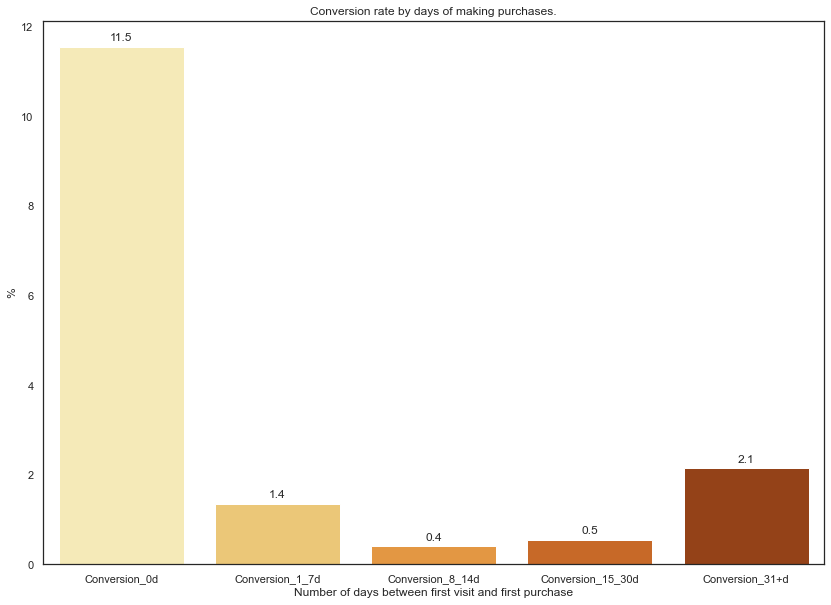

In [40]:
conversion_table=pd.DataFrame(conversion_table1,columns=['Conversion','Rate'])
print('Only '+ blue('{} ({:.2%})'.format(orders['uid'].nunique(),orders['uid'].nunique() / visits_new['uid'].nunique() ), 'bold') + ' of visitors make purchases.')
print()
print('Distribution by the period in the graph below:')
plt.figure(figsize=(14,10))

splot= sns.barplot(x='Conversion', y='Rate', data=conversion_table, palette="YlOrBr")   


plt.title('Conversion rate by days of making purchases.')
plt.ylabel("%")
plt.xlabel('Number of days between first visit and first purchase')


for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

plt.show()

*(!) Interesting to check differences between sources.*

In [41]:
registrations_source=visits_new.groupby('real_source_id').agg({'uid':'nunique'}).reset_index()
registrations_source=registrations_source.rename(columns={'uid':'registered'})
registrations_source

,real_source_id,registered
0,1,10714
1,2,19859
2,3,68640
3,4,66926
4,5,48518
5,9,6589
6,10,6893


In [42]:
conversion_source=conversion_df.merge(real_source_id, on=['uid'], how='left')
conversion_source

,uid,buy_ts,start_ts,conversion_date,Conversion_0d,Conversion_1_7d,Conversion_8_14d,Conversion_15_30d,Conversion_31+d,real_source_id
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,106,False,False,False,False,True,2.0
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0,True,False,False,False,False,10.0
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,0,True,False,False,False,False,3.0
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,0,True,False,False,False,False,5.0
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0,True,False,False,False,False,5.0
...,...,...,...,...,...,...,...,...,...,...
36504,18445147675727495770,2017-11-24 09:03:00,2017-08-20 13:30:00,95,False,False,False,False,True,5.0
36505,18445407535914413204,2017-09-22 23:55:00,2017-09-22 23:48:00,0,True,False,False,False,False,3.0
36506,18445601152732270159,2018-03-26 22:54:00,2017-08-07 11:51:00,231,False,False,False,False,True,2.0
36507,18446156210226471712,2018-02-18 19:34:00,2017-11-07 10:01:00,103,False,False,False,False,True,1.0


In [43]:
def conversion(column):
    abs_conversion=conversion_source[conversion_source[column]==True]\
    .groupby(['real_source_id'])['uid'].nunique().reset_index().rename(columns={'uid':'{}'.format(column)})
    conversions=registrations_source.merge(abs_conversion,on=['real_source_id'],how='left')
    conversions['{}%'.format(column)]=(conversions['{}'.format(column)]*100/conversions['registered']).fillna(0)
    conversions=conversions[['real_source_id','{}%'.format(column)]]
    return conversions

In [44]:
conversion_new=[]
for i in ['Conversion_0d','Conversion_1_7d','Conversion_8_14d','Conversion_15_30d','Conversion_31+d']:
    conversion_new.append(conversion(i))
conversion_new

[   real_source_id  Conversion_0d%
 0               1       22.783274
 1               2       14.411602
 2               3       11.493298
 3               4        9.352120
 4               5       10.657900
 5               9       11.473668
 6              10       14.072247,
    real_source_id  Conversion_1_7d%
 0               1          3.210752
 1               2          2.386827
 2               3          1.338869
 3               4          1.008577
 4               5          0.943980
 5               9          1.532858
 6              10          1.581314,
    real_source_id  Conversion_8_14d%
 0               1           1.017360
 1               2           0.845964
 2               3           0.346737
 3               4           0.306308
 4               5           0.278247
 5               9           0.652603
 6              10           0.449732,
    real_source_id  Conversion_15_30d%
 0               1            0.989360
 1               2            1.022207


In [45]:
conversion_new=pd.concat(conversion_new,axis=1)
conversion_new=conversion_new.loc[:,~conversion_new.columns.duplicated()]
conversion_new=conversion_new.set_index('real_source_id')
conversion_new

,Conversion_0d%,Conversion_1_7d%,Conversion_8_14d%,Conversion_15_30d%,Conversion_31+d%
real_source_id,,,,,
1,22.783274,3.210752,1.017360,0.989360,2.893410
2,14.411602,2.386827,0.845964,1.022207,4.114004
3,11.493298,1.338869,0.346737,0.514277,2.108100
4,9.352120,1.008577,0.306308,0.428832,1.706362
5,10.657900,0.943980,0.278247,0.408096,1.479863
9,11.473668,1.532858,0.652603,1.107907,5.038701
10,14.072247,1.581314,0.449732,0.406209,1.987524


The conversion rate for buyers from the source_id=1 is 30.9%
The conversion rate for buyers from the source_id=2 is 22.8%
The conversion rate for buyers from the source_id=3 is 15.8%
The conversion rate for buyers from the source_id=5 is 13.8%
The conversion rate for buyers from the source_id=4 is 12.8%
The conversion rate for buyers from the source_id=9 is 19.8%
The conversion rate for buyers from the source_id=10 is 18.5%



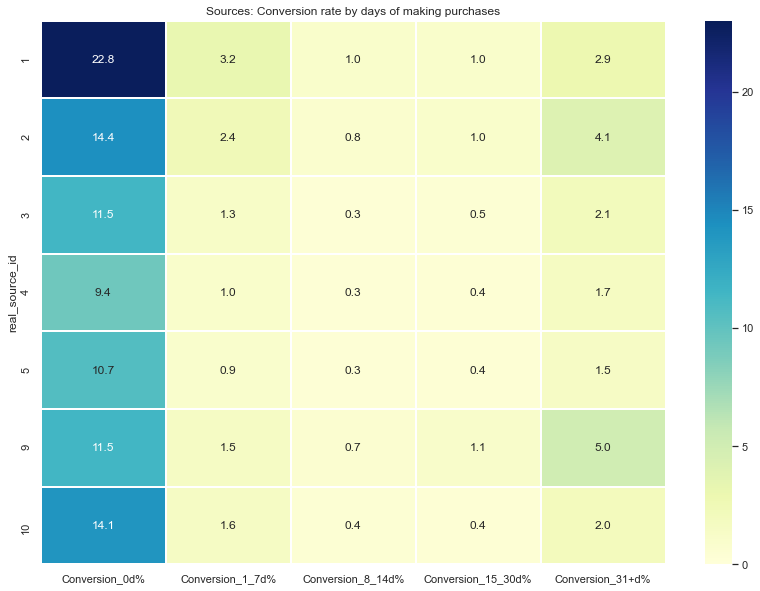

In [46]:
orders_new=orders.merge(real_source_id, on=['uid'], how='left')
orders_new=orders_new.dropna()
orders_new['real_source_id']=orders_new['real_source_id'].astype(int)

buyers_source=orders_new.groupby('real_source_id').agg({'uid':'nunique'}).reset_index()
conv_rt_s=buyers_source.merge(registrations_source, on=['real_source_id'], how='left')
conv_rt_s['conv_rt']=conv_rt_s['uid'] / conv_rt_s['registered'] 

source_name=orders_new['real_source_id'].unique()

for i in source_name:
    print('The conversion rate for buyers from the source_id='+black(i,'bold')\
          +' is '+ blue('{:.1%}'.format(conv_rt_s.query('real_source_id ==@i')['conv_rt'].sum()),'bold'))
print()

sns.set(style='white')
plt.figure(figsize=(14,10))
plt.title('Sources: Conversion rate by days of making purchases')
sns.heatmap(conversion_new, annot=True, fmt= '.1f', linewidths=1, cmap="YlGnBu", vmin=0, vmax=23)  #  YlOrBr Blues
plt.show()

***Task 2.*** How many orders do they make during a given period of time?

In [47]:
orders_new['purchase_date']=orders_new['buy_ts'].dt.date
orders_new['purchase_year_month']=orders_new['buy_ts'].dt.to_period("M")
orders_new.head()

,buy_ts,revenue,uid,real_source_id,purchase_date,purchase_year_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,1,2017-06-01,2017-06
1,2017-06-01 00:25:00,0.55,11627257723692907447,2,2017-06-01,2017-06
2,2017-06-01 00:27:00,0.37,17903680561304213844,2,2017-06-01,2017-06
3,2017-06-01 00:29:00,0.55,16109239769442553005,2,2017-06-01,2017-06
4,2017-06-01 07:58:00,0.37,14200605875248379450,3,2017-06-01,2017-06


***Purchases per day in total and by sources***

In [48]:
pr=orders_new.groupby('purchase_date').agg({'uid':['count', 'nunique']}).reset_index()
pr.columns=['purchase_date', 'purch_n', 'users_uniq']
pr['p_p_u']=pr['purch_n']/pr['users_uniq']
pr.head()

,purchase_date,purch_n,users_uniq,p_p_u
0,2017-06-01,96,86,1.116279
1,2017-06-02,111,101,1.099010
2,2017-06-03,67,61,1.098361
3,2017-06-04,66,59,1.118644
4,2017-06-05,161,146,1.102740


In [49]:
purchase_per_day=orders_new.groupby('purchase_date').agg({'uid':['count', 'nunique']}).reset_index()
purchase_per_day.columns=['purchase_date', 'number_purch', 'uniq_buyers']
purchase_per_day['purch_buyer']=purchase_per_day['number_purch'] / purchase_per_day['uniq_buyers']

fig=px.line(purchase_per_day, x='purchase_date', y='number_purch')
fig.update_layout( title='Daily number of purchases, 2017-2018',
                   xaxis_title='Purchase date',
                   yaxis_title='Number of purchases')
fig.show()

max_order=purchase_per_day['number_purch'].max()
min_order=purchase_per_day['number_purch'].min()

print('The total number of purchases: '+ black('{}'.format(orders_new['uid'].count()), 'bold'))
print()
print('The average number of purchases per day: ' +black('{:.1f}'.format(purchase_per_day['number_purch'].mean()), 'bold'))
print('The average number of purchases per user per day: ' +black('{:.1f}'.format(purchase_per_day['purch_buyer'].mean()),'bold'))
print()
print('The maximum number of daily purchases ' + green('{}'.format(max_order), 'bold') + ' was on '\
     + black(purchase_per_day['purchase_date'][purchase_per_day.query('number_purch == @max_order')\
                                                                 .index[0]].strftime("%Y-%m-%d" ),'bold'))
print('The minimum number of daily purchases ' + red('{}'.format(min_order), 'bold') + ' was on '\
     + black(purchase_per_day['purchase_date'][purchase_per_day.query('number_purch == @min_order')\
                                                                 .index[0]].strftime("%Y-%m-%d" ),'bold'))


The total number of purchases: 50363

The average number of purchases per day: 138.4
The average number of purchases per user per day: 1.1

The maximum number of daily purchases 814 was on 2017-11-24
The minimum number of daily purchases 1 was on 2018-06-01


In [50]:
purchase_per_day_s=orders_new.groupby(['real_source_id', 'purchase_date']).agg({'uid':'count'}).reset_index()

fig=px.line(purchase_per_day_s, x='purchase_date', y='uid', color='real_source_id')
fig.update_layout( title='Daily number of purchases 2017-2018, by sources',
                   xaxis_title='Purchase date',
                   yaxis_title='Number of purchases')
fig.show()
source_name=orders_new['real_source_id'].unique()
for i in source_name:
    print('The average number of purchases per day by customers from the source ' + black(i,'bold')\
         + ' : ' + blue('{:.1f}'.format(purchase_per_day_s.query('real_source_id == @i')['uid'].mean()),'bold'))

The average number of purchases per day by customers from the source 1 : 15.6
The average number of purchases per day by customers from the source 2 : 23.5
The average number of purchases per day by customers from the source 3 : 35.4
The average number of purchases per day by customers from the source 5 : 25.6
The average number of purchases per day by customers from the source 4 : 29.5
The average number of purchases per day by customers from the source 9 : 5.6
The average number of purchases per day by customers from the source 10 : 4.5


***Purchases per month in total and by sources***

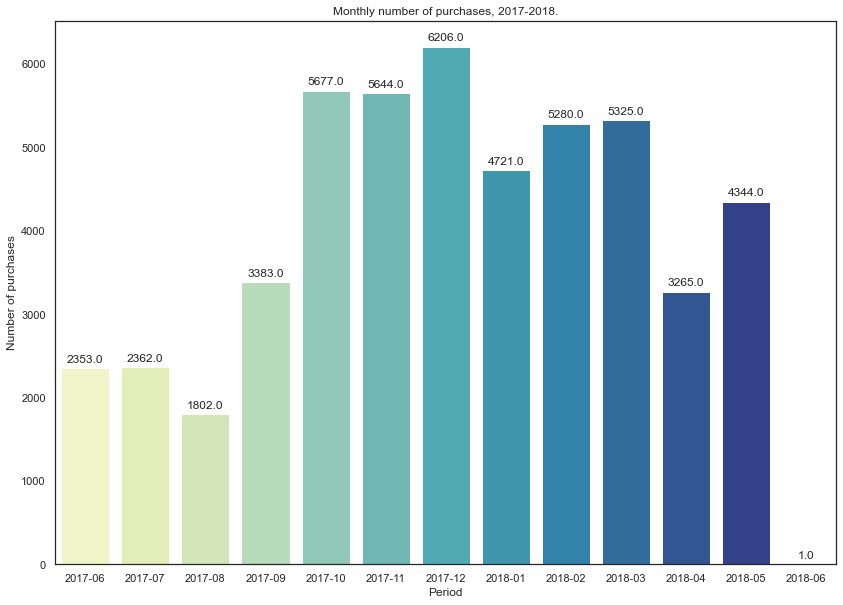

In [51]:
purchase_per_month=orders_new.groupby('purchase_year_month').agg({'uid':'count'}).reset_index()

plt.figure(figsize=(14,10))

splot= sns.barplot(x='purchase_year_month', y='uid', data=purchase_per_month, palette="YlGnBu")


plt.title('Monthly number of purchases, 2017-2018.')
plt.ylabel('Number of purchases')
plt.xlabel('Period')


for p in splot.patches:
    splot.annotate(format(p.get_height(),'.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')


The number of purchases by sources:

The number of purchases by customers from the source 1: 5634 or 11.19% of total purchases.
The number of purchases by customers from the source 2: 8523 or 16.92% of total purchases.
The number of purchases by customers from the source 3: 12868 or 25.55% of total purchases.
The number of purchases by customers from the source 5: 9289 or 18.44% of total purchases.
The number of purchases by customers from the source 4: 10720 or 21.29% of total purchases.
The number of purchases by customers from the source 9: 1867 or 3.71% of total purchases.
The number of purchases by customers from the source 10: 1462 or 2.90% of total purchases.


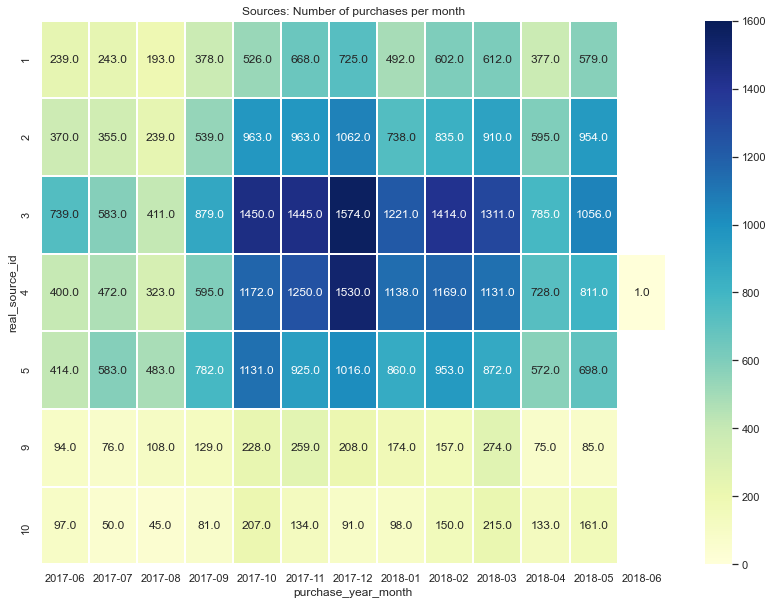

In [52]:
purchase_per_month_s=orders_new.groupby(['real_source_id','purchase_year_month']).agg({'uid':'count'}).reset_index()
purchase_per_month_s_pt=purchase_per_month_s.pivot_table(index='real_source_id', columns='purchase_year_month', values='uid', aggfunc='sum')

print(black('The number of purchases by sources:', 'bold'))
print()
for i in source_name:
    print('The number of purchases by customers from the source '+ black(i,'bold') + ': '\
          + blue('{}'.format(orders_new.query('real_source_id ==@i')['uid'].count()),'bold')\
          + ' or '+ black('{:.2%}'.format(orders_new.query('real_source_id ==@i')['uid'].count()\
                                          / orders_new['uid'].count()),'bold') +' of total purchases.')


sns.set(style='white')
plt.figure(figsize=(14,10))
plt.title('Sources: Number of purchases per month')
sns.heatmap(purchase_per_month_s_pt, annot=True, fmt= '.1f', linewidths=1, cmap="YlGnBu", vmin=0, vmax=1600)  #  YlOrBr Blues
plt.show()

***3.*** Let's check the average purchase size.

***Daily purchase size in total and by sources***

In [53]:
purchase_per_day_avg=orders_new.groupby('purchase_date').agg({'revenue':'mean'}).reset_index()

fig=px.line(purchase_per_day_avg, x='purchase_date', y='revenue')
fig.update_layout(title='Daily average purchase size, 2017-2018',
                  xaxis_title='Period',
                  yaxis_title='Revenue')
fig.show()

max_order_size=orders_new['revenue'].max()
min_order_size=orders_new['revenue'].min()

print('The total revenue for period 2017.07-2018.06: '+ black('{}'.format(orders_new['revenue'].sum().astype(int)), 'bold'))
print()
print('The average daily purchase size: ' +black('{:.1f}'.format(purchase_per_day_avg['revenue'].mean()), 'bold'))
print()
print('The maximum size of purchase ' + green('{}'.format(max_order_size), 'bold') + ' was on '\
     + black(orders_new['buy_ts'][orders_new.query('revenue == @max_order_size')\
                                                                 .index[0]].strftime("%Y-%m-%d" ),'bold'))
print('The minimum size of purchase ' + red('{:.2f}'.format(min_order_size), 'bold') + ' was on '\
     + black(orders_new['buy_ts'][orders_new.query('revenue == @min_order_size')\
                                                                 .index[0]].strftime("%Y-%m-%d" ),'bold'))

The total revenue for period 2017.07-2018.06: 252055

The average daily purchase size: 4.9

The maximum size of purchase 2633.28 was on 2017-12-10
The minimum size of purchase 0.01 was on 2018-03-16


In [54]:
purchase_per_day_s_avg=orders_new.groupby(['real_source_id','purchase_date']).agg({'revenue':'mean'}).reset_index()

fig=px.line(purchase_per_day_s_avg, x='purchase_date', y='revenue', color='real_source_id')
fig.update_layout(title='Sources: Daily average purchase size, 2017-2018',
                  xaxis_title='Period',
                  yaxis_title='Revenue')
fig.show()

for i in source_name:
    print('The average daily purchase size by customers from the source ' + black(i,'bold')\
         + ' : ' + blue('{:.1f}'.format(purchase_per_day_s_avg.query('real_source_id == @i')['revenue'].mean()),'bold'))

The average daily purchase size by customers from the source 1 : 6.4
The average daily purchase size by customers from the source 2 : 7.5
The average daily purchase size by customers from the source 3 : 4.1
The average daily purchase size by customers from the source 5 : 4.3
The average daily purchase size by customers from the source 4 : 4.2
The average daily purchase size by customers from the source 9 : 3.4
The average daily purchase size by customers from the source 10 : 2.6


***Monthly average purchase size per customer in total and by source*** 

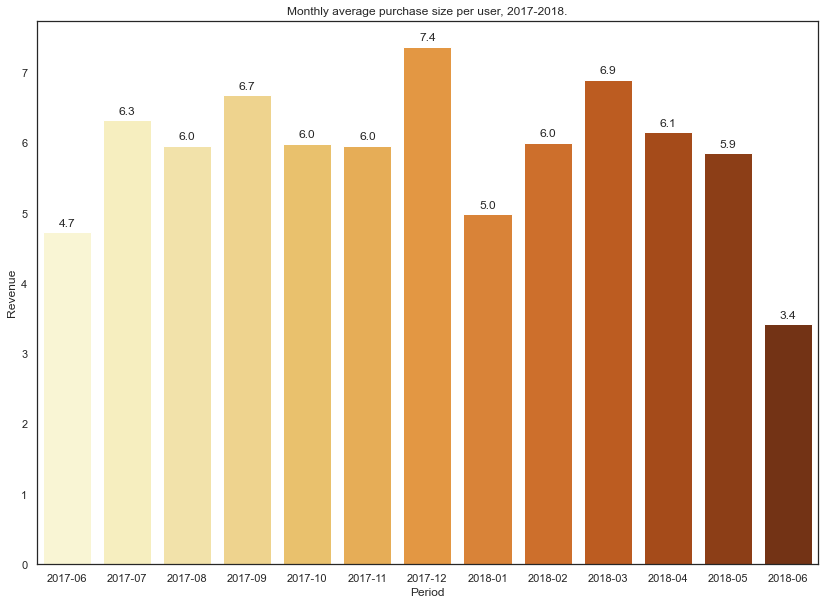

In [55]:
purchase_per_month_avg1=orders_new.groupby('purchase_year_month').agg({'revenue':'sum', 'uid':'nunique'}).reset_index()
purchase_per_month_avg1['revenue_user']=purchase_per_month_avg1['revenue'] / purchase_per_month_avg1['uid']

plt.figure(figsize=(14,10))

splot= sns.barplot(x='purchase_year_month', y='revenue_user', data=purchase_per_month_avg1, palette="YlOrBr")


plt.title('Monthly average purchase size per user, 2017-2018.')
plt.ylabel("Revenue")
plt.xlabel('Period')


for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

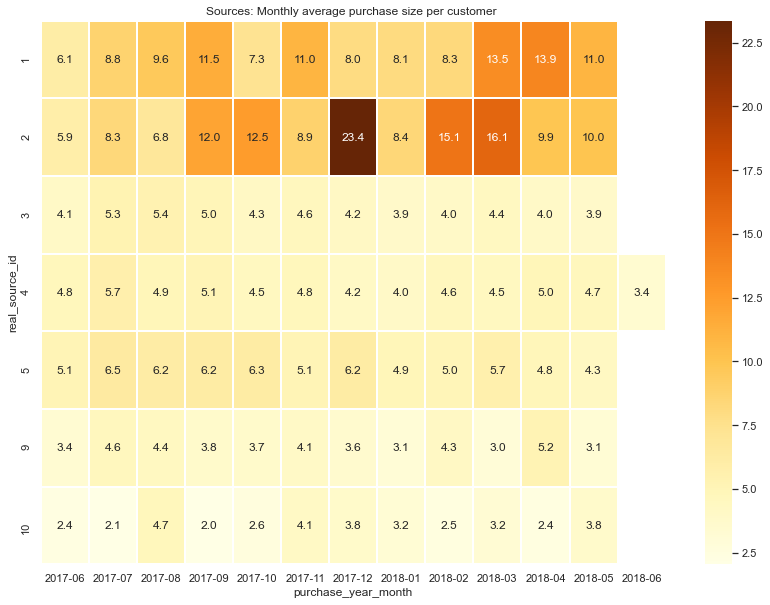

In [56]:
purchase_per_month_s_avg1=orders_new.groupby(['real_source_id','purchase_year_month']).agg({'revenue':'sum','uid':'nunique'}).reset_index()
purchase_per_month_s_avg1['revenue_user']=purchase_per_month_s_avg1['revenue'] /purchase_per_month_s_avg1['uid']
purchase_per_month_s_avg1_pt=purchase_per_month_s_avg1.pivot_table(index='real_source_id', columns='purchase_year_month', values='revenue_user', aggfunc='sum')

sns.set(style='white')
plt.figure(figsize=(14,10))
plt.title('Sources: Monthly average purchase size per customer ')
sns.heatmap(purchase_per_month_s_avg1_pt, annot=True, fmt= '.1f', linewidths=1, cmap="YlOrBr")  #  YlOrBr Blues
plt.show()

***4.*** Let's check, how much money do they bring(LTV)

*(!) Since I did the calculations in the previous steps for sources I'll also calculate LTV by sources. But before I'll calculate revenue.* 

***Monthly revenue in total and by sources***

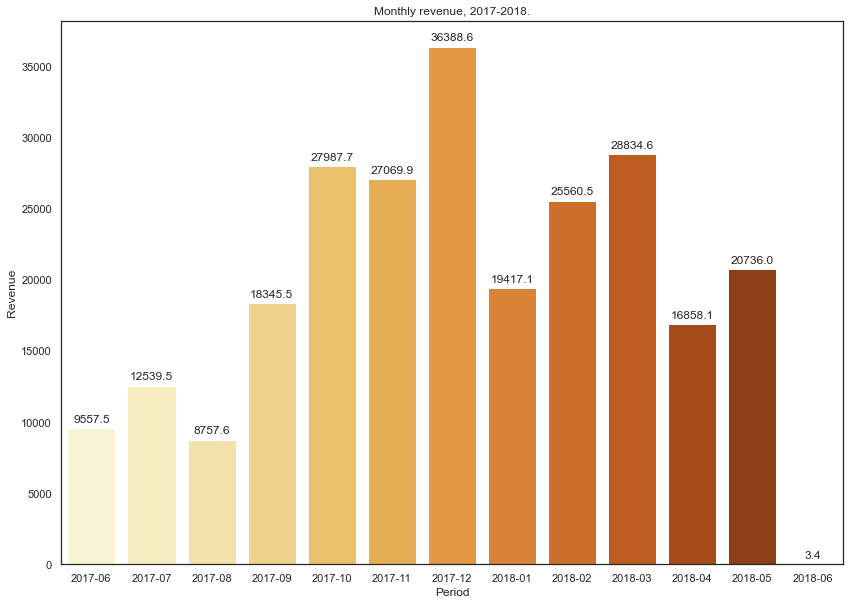

In [57]:
purchase_per_month_sum=orders_new.groupby('purchase_year_month').agg({'revenue':'sum'}).reset_index()

plt.figure(figsize=(14,10))

splot= sns.barplot(x='purchase_year_month', y='revenue', data=purchase_per_month_sum, palette="YlOrBr")


plt.title('Monthly revenue, 2017-2018.')
plt.ylabel("Revenue")
plt.xlabel('Period')


for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')


The revenue by sources:

The revenue from customers from the source 1: 37545.1 or 14.90% of total revenue.
The revenue from customers from the source 2: 69413.4 or 27.54% of total revenue.
The revenue from customers from the source 3: 50922.1 or 20.20% of total revenue.
The revenue from customers from the source 5: 40342.9 or 16.01% of total revenue.
The revenue from customers from the source 4: 43803.3 or 17.38% of total revenue.
The revenue from customers from the source 9: 5978.0 or 2.37% of total revenue.
The revenue from customers from the source 10: 4051.2 or 1.61% of total revenue.


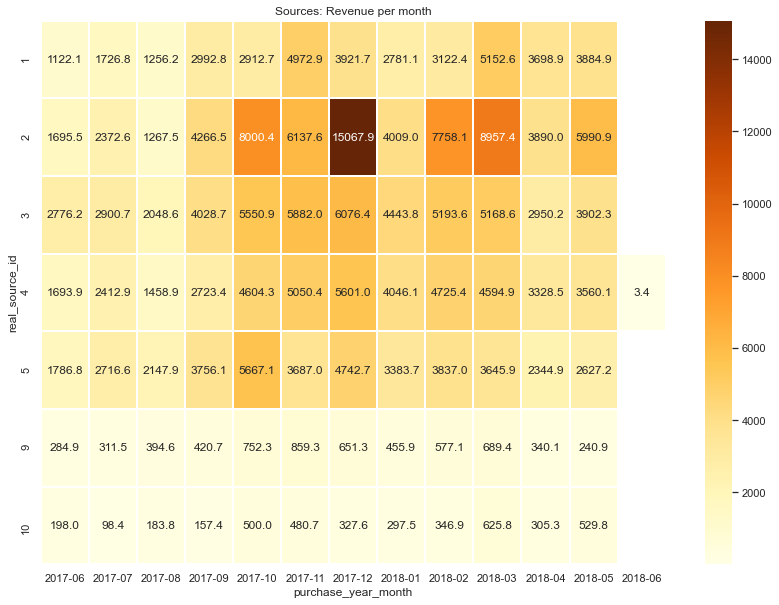

In [58]:
purchase_per_month_s_sum=orders_new.groupby(['real_source_id','purchase_year_month']).agg({'revenue':'sum'}).reset_index()
purchase_per_month_s_sum_pt=purchase_per_month_s_sum.pivot_table(index='real_source_id', columns='purchase_year_month', values='revenue', aggfunc='sum')

print(black('The revenue by sources:', 'bold'))
print()
for i in source_name:
    print('The revenue from customers from the source '+ black(i,'bold') + ': '\
          + blue('{:.1f}'.format(orders_new.query('real_source_id ==@i')['revenue'].sum()),'bold')\
          + ' or '+ black('{:.2%}'.format(orders_new.query('real_source_id ==@i')['revenue'].sum()\
                                          / orders_new['revenue'].sum()),'bold') +' of total revenue.')


sns.set(style='white')
plt.figure(figsize=(14,10))
plt.title('Sources: Revenue per month')
sns.heatmap(purchase_per_month_s_sum_pt, annot=True, fmt= '.1f', linewidths=1, cmap="YlOrBr")  #  YlOrBr Blues
plt.show()

The common LTV: 6.9


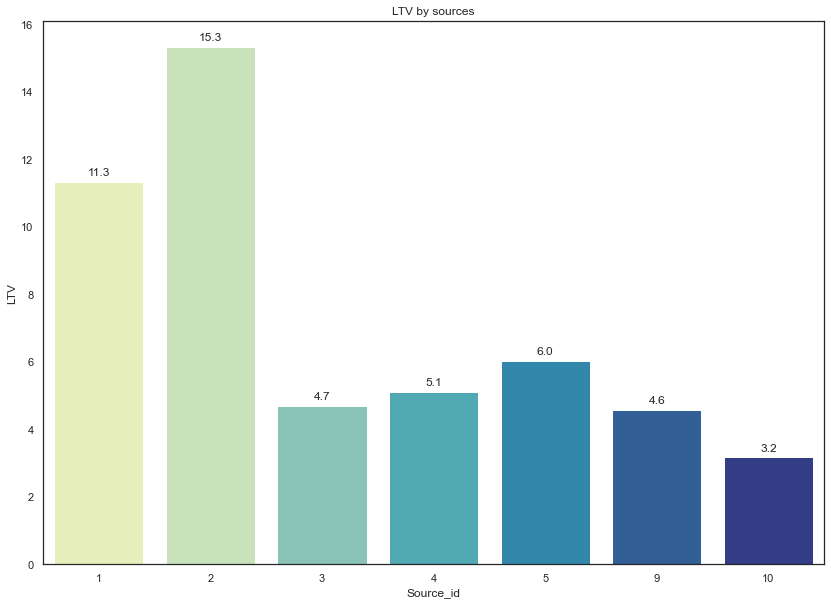

In [59]:
ltv_sources=orders_new.groupby('real_source_id').agg({'revenue':'sum','uid':'nunique'}).reset_index()
ltv_sources['ltv']=ltv_sources['revenue'] / ltv_sources['uid']

print('The common LTV: ' + black('{:.1f}'.format(ltv_sources['revenue'].sum()/ltv_sources['uid'].sum()),'bold'))

plt.figure(figsize=(14,10))

splot= sns.barplot(x='real_source_id', y='ltv', data=ltv_sources, palette="YlGnBu")


plt.title('LTV by sources')
plt.ylabel("LTV")
plt.xlabel('Source_id')


for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')


*(!) Now it's time for calculations by cohorts*

In [60]:
min_order_date['first_order']=min_order_date['buy_ts'].dt.date
min_order_date['first_order_month']=min_order_date['first_order'].astype('datetime64[M]')

cohort_size=min_order_date.groupby('first_order_month')['uid'].nunique().reset_index()
cohort_size.columns=['first_order_month', 'n_buyers']

min_order_cohort=min_order_date.merge(cohort_size, on=['first_order_month'], how='left')

orders_=orders_new.merge(min_order_cohort, on=['uid'], how='left')
orders_['order_month']=orders_['purchase_date'].astype('datetime64[M]')

orders_['cohort_lifetime']=((orders_['order_month'] - orders_['first_order_month']) / np.timedelta64(1, 'M')).round().astype('int')

revenue_cohorts=orders_.groupby(['first_order_month','cohort_lifetime']).agg({'revenue':'sum'}).reset_index()

ltv_=revenue_cohorts.merge(cohort_size, on=['first_order_month'], how='left')
ltv_['ltv'] = ltv_['revenue'] / ltv_['n_buyers']   

ltv_result = ltv_.pivot_table(index='first_order_month', columns='cohort_lifetime', values='ltv', aggfunc='mean').round(2)

ltv_result_cum=ltv_result.cumsum(axis=1).round(2)

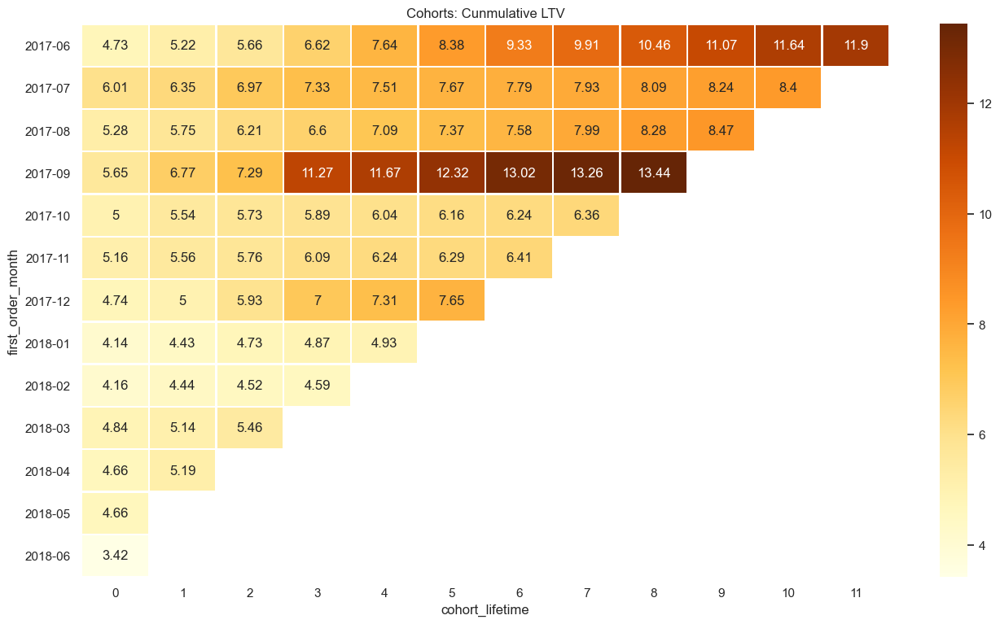

Average LTV for 6 months from the first order: 7.98


In [61]:
fig, axes = plt.subplots(1, 1, figsize=(16, 9), dpi=100)
plt.title('Cohorts: Cunmulative LTV')
axes=sns.heatmap(ltv_result_cum, annot=True, fmt= 'g', linewidths=1, cmap="YlOrBr")  #  YlOrBr Blues
axes.set_yticklabels(ltv_result_cum.index.strftime('%Y-%m'))
plt.show()

print('Average LTV for 6 months from the first order: ' +black('{:.2f}'.format(ltv_result.cumsum(axis=1).mean(axis=0)[5]),'bold'))

<a id=conc2_2></a>
***Conclusions***

**1.** When do people start buying?

First of all, only **16%** of visitors have become buyers. Most of them (**11%** of visitors) started buying on the day of their first visit.

If to talk about `sources`:
 - *minimum* conversion rate (**12.8%** total / **9.4%** who started buying on the day of their first visit) has `source_id`=**4**;
 - *maximum* conversion rate (**30.9%** total / **22.8%** who started buying on the day of their first visit) has `source_id`=**1**.
 
**2.** How many orders do they make during a given period of time?

1. The *total* number of purchases: **50363**.
2. The *average* number of purchases per day: **138.4**.
3. The *average* number of purchases per user per day: **1.1**.
4. The *maximum* number of daily purchases **814** was on **2017-11-24**.
5. The *minimum* number of daily purchases **1** was on **2018-06-01**.
6. The *maximum* average number of daily purchases **35.4** has `source_id`=3.
7. The *minimum* average number of daily purchases **4.5** has `source_id`=10.
8. The *maximum* number of monthly purchases **6206** was on **2017-12**.
9. The *minimum* number of monthly purchases **1802** was on **2017-08**.  (*2018-06 data incomplete*)

Since the *maximum* number of purchases was on **December**, New Year's Holidays should be very rich culturally. 

**3.** What is the average purchase size?

1. The *total* revenue: **252055**.
2. The *average* daily purchase size: **4.9**.
3. The *maximum* size of purchase **2633** was on **2017-12-10**.
4. The *minimum* size of purchase **0.01** was on **2018-03-16**.
5. The *maximum* daily purchase size **7.5** has `source_id`=2. 
6. The *minimum* daily purchase size **2.6** has `source_id`=10.
7. The *maximum* monthly average purchase size per user **7.4** was on **2017-12**.
8. The *minimum* monthly average purchase size per user **4.7** was on **2017-06**.  (*2018-06 data incomplete*)

Yes, **December** should be a very profitable month.

**4.** How much money do they bring? (LTV)

1. The *maximum* revenue **36389** was on **2017-12**.
2. The *minimum* revenue **8758** was on **2017-08**.  (*2018-06 data incomplete*)
3. The *maximum* revenue **69413**(***28%***) has `source_id`=2.
4. The *minimum* revenue **4051**(***1.6%***) has `source_id`=10.
5. The *overall* LTV by sources: **6.9**.
6. The *maximum* LTV **15.3** has `source_id`=2.
7. The *minimum* LTV **3.2** has `source_id`=10.
8. The *average* LTV for 6 months from the first order: **7.98**.
9. Buyers with `first_order_month`=2017-09 have the hightest LTV.

We have leader among **sources**: buyers from `source_id`=2 brought the maximum **revenue** and have maximum **LTV**.

___[Back to contents](#cont)___

<a id=id2_3></a>
**2.3. MARKETING**

***1.*** Let's check, how much money was spent. Overall/per source/over time.

The total amount of cost: 329131.62


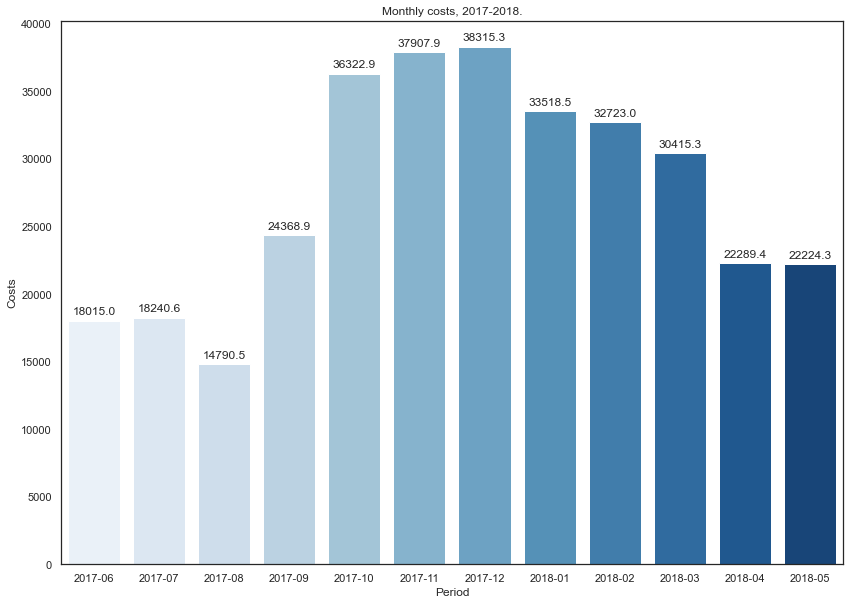

In [62]:
print('The total amount of cost: ' + black('{:.2f}'.format(costs['costs'].sum()),'bold'))

costs['year_month']=costs['dt'].dt.to_period('M')

costs_per_month=costs.groupby('year_month').agg({'costs':'sum'}).reset_index()

plt.figure(figsize=(14,10))

splot= sns.barplot(x='year_month', y='costs', data=costs_per_month, palette="Blues")


plt.title('Monthly costs, 2017-2018.')
plt.ylabel("Costs")
plt.xlabel('Period')


for p in splot.patches:
    splot.annotate(format(p.get_height(),'.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')



The costs by sources:

The cost for ad for source 1: 20833.27 or 6.33% of total costs.
The cost for ad for source 2: 42806.04 or 13.01% of total costs.
The cost for ad for source 3: 141321.63 or 42.94% of total costs.
The cost for ad for source 4: 61073.60 or 18.56% of total costs.
The cost for ad for source 5: 51757.10 or 15.73% of total costs.
The cost for ad for source 9: 5517.49 or 1.68% of total costs.
The cost for ad for source 10: 5822.49 or 1.77% of total costs.


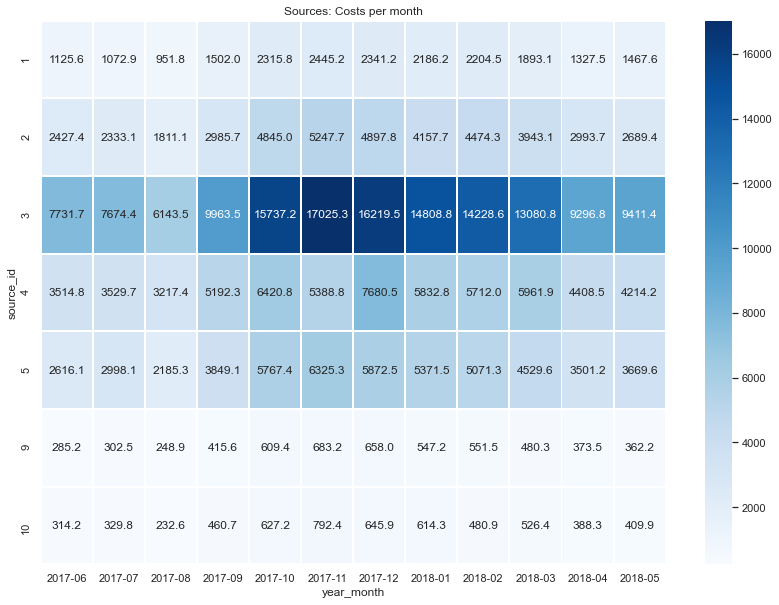

In [63]:
costs_per_month_s=costs.groupby(['source_id','year_month']).agg({'costs':'sum'}).reset_index()
costs_per_month_s_pt=costs_per_month_s.pivot_table(index='source_id', columns='year_month', values='costs', aggfunc='sum')

print(black('The costs by sources:', 'bold'))
print()

source_name1=costs['source_id'].unique()  
for i in source_name1:
    print('The cost for ad for source '+ black(i,'bold') + ': '\
          + blue('{:.2f}'.format(costs.query('source_id ==@i')['costs'].sum()),'bold')\
          + ' or '+ black('{:.2%}'.format(costs.query('source_id ==@i')['costs'].sum()\
                                          / costs['costs'].sum()),'bold') +' of total costs.')


sns.set(style='white')
plt.figure(figsize=(14,10))
plt.title('Sources: Costs per month')
sns.heatmap(costs_per_month_s_pt, annot=True, fmt= '.1f', linewidths=1, cmap="Blues")  #  YlOrBr YlOrBr Blues
plt.show()

***2.*** Let's check, how much did customer acquisition from each of the sources cost.

The common customer acquisition cost: 9.0


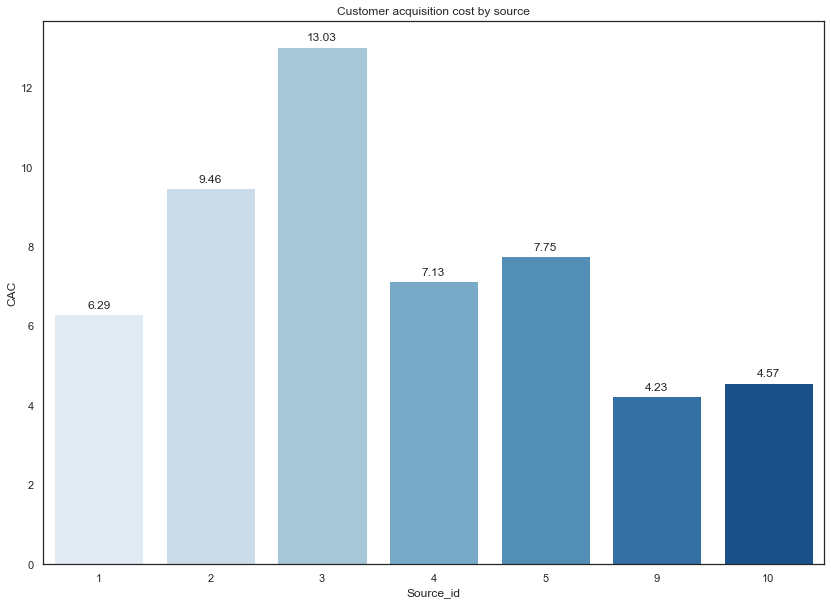

In [64]:
costs_per_source=costs.groupby('source_id').agg({'costs':'sum'}).reset_index()
buyers_per_source=orders_new.groupby('real_source_id').agg({'uid':'nunique'}).reset_index()
cac_sources=costs_per_source.merge(buyers_per_source, left_on=['source_id'], right_on=['real_source_id'])
cac_sources['cac']=cac_sources['costs'] / cac_sources['uid']

print('The common customer acquisition cost: ' + black('{:.1f}'.format(cac_sources['costs'].sum()/cac_sources['uid'].sum()),'bold'))

plt.figure(figsize=(14,10))

splot= sns.barplot(x='source_id', y='cac', data=cac_sources, palette="Blues")


plt.title('Customer acquisition cost by source')
plt.ylabel("CAC")
plt.xlabel('Source_id')


for p in splot.patches:
    splot.annotate(format(p.get_height(),'.2f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')



***3.*** Let's check, how worthwhile where the investments (ROI)

The common ROI: 0.8


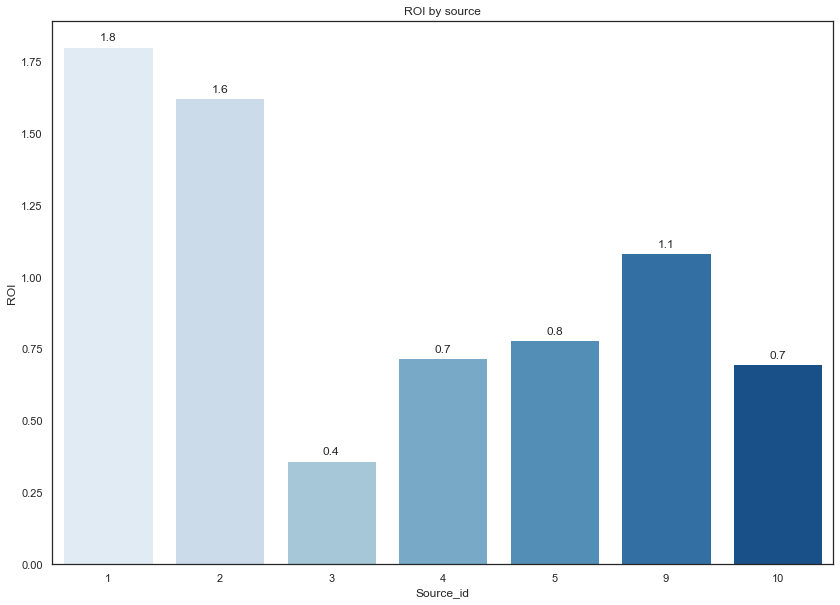

In [65]:
roi_sources=cac_sources.merge(ltv_sources, on=['real_source_id'],how='left')
roi_sources['roi']=roi_sources['ltv'] / roi_sources['cac']

ltv=roi_sources['revenue'].sum()/roi_sources['uid_y'].sum()
cac=roi_sources['costs'].sum()/roi_sources['uid_y'].sum()

print('The common ROI: ' + black('{:.1f}'.format(ltv/cac),'bold'))

plt.figure(figsize=(14,10))

splot= sns.barplot(x='source_id', y='roi', data=roi_sources, palette="Blues")


plt.title('ROI by source')
plt.ylabel("ROI")
plt.xlabel('Source_id')


for p in splot.patches:
    splot.annotate(format(p.get_height(),'.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')



*(!)Now let's calculate ROI for cohorts*

In [66]:
costs['month']=costs['dt'].astype('datetime64[M]')
monthly_costs=costs.groupby('month').sum().reset_index()
roi_cohort=ltv_.merge(monthly_costs, left_on='first_order_month', right_on='month')
roi_cohort['cac']=roi_cohort['costs'] / roi_cohort ['n_buyers']
roi_cohort['roi']=roi_cohort['ltv'] / roi_cohort['cac']
roi_cohort_result=roi_cohort.pivot_table(index='first_order_month', columns='cohort_lifetime', values='roi', aggfunc='sum')
roi_cohort_result_cum=roi_cohort_result.cumsum(axis=1).round(2)

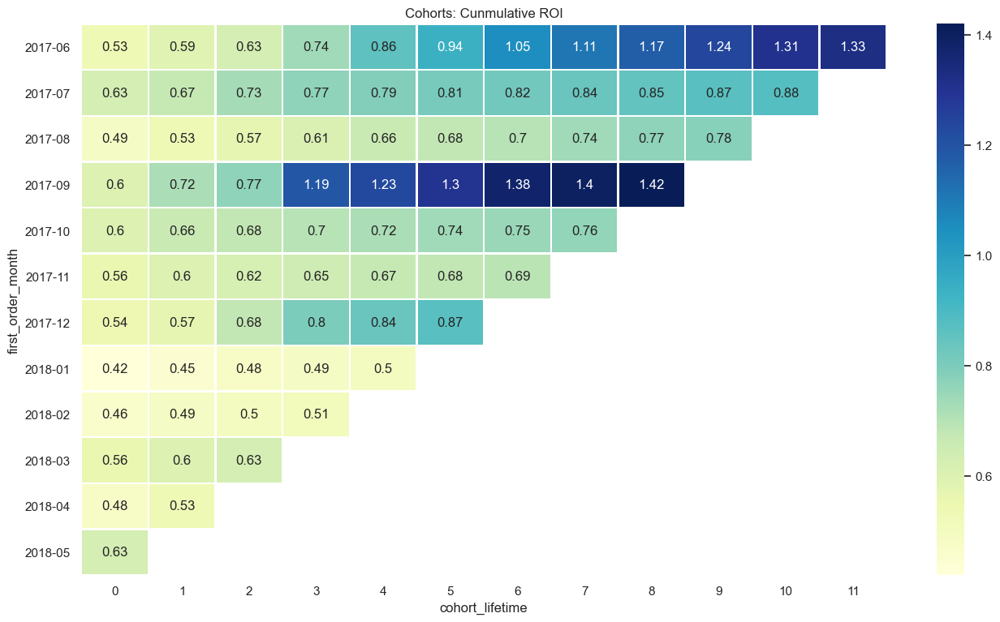

In [67]:
fig, axes = plt.subplots(1, 1, figsize=(16, 9), dpi=100)
plt.title('Cohorts: Cunmulative ROI')
axes=sns.heatmap(roi_cohort_result_cum, annot=True, fmt= 'g', linewidths=1, cmap="YlGnBu")  #  YlOrBr Blues
axes.set_yticklabels(roi_cohort_result_cum.index.strftime('%Y-%m'))
plt.show()


<a id=conc2_3></a>
***Conclusions***

**Task 1.** How much money was spent? Overall/per source/over time

1. The *total* costs: **329132**.
2. The *maximum* costs **38315** were on **2017-12**.
3. The *minimum* costs **14790** were on **2017-08**.
3. The *maximum* costs **141322** (***13%***) has `source_id`=3.
4. The *minimum* costs **5517** (***1.7%***) has `source_id`=9.

We have the same months for *maximum* and *minimum* costs as we do for revenue. But for **sources** the picture is different.

**Task 2.** How much did customer acquisition from each of the sources cost?

1. The *overall* CAC **9**.
2. The *maximum* CAC has `source_id`=3.
3. The *minimum* CAC has `source_id`=9.

**Sources** with *maximum* and *minimum* costs have the same CAC. Nice.

**Task 3.** How worthwhile where the investments? (ROI)

1. The *overall* ROI **0.8**.
2. The *maximum* ROI **1.8** has `source_id`=1.
3. The *minimum* ROI **0.4** has `source_id`=3.
4. Buyers with `first_order_month`=2017-09 have the hightest ROI 

Very interesting results. Our leader with ROI=**1.8** is `source_id`=1, but it has neither maximum revenue nor minimum costs.  

___[Back to contents](#cont)___

<a id=id3></a>
### 3. Advice to marketing experts how much money to invest and where.

*(!) Firstly I'll create a table with key metrics.*

In [68]:
results=roi_sources.merge(registrations_source, on=['real_source_id'], how='left')
results['conversion_rate']=results['uid_x'] / results['registered']
results=results.drop(columns=['source_id', 'uid_y'])
results=results.rename(columns={'uid_x':'buyers'})
results=results[['real_source_id', 'registered', 'buyers', 'conversion_rate', 'revenue', 'costs', 'ltv', 'cac', 'roi']]
results['conversion_rate']=round(results['conversion_rate'],2)
results['ltv']=round(results['ltv'],2)
results['cac']=round(results['cac'],2)
results['roi']=round(results['roi'],2)
results

,real_source_id,registered,buyers,conversion_rate,revenue,costs,ltv,cac,roi
0,1,10714,3310,0.31,37545.10,20833.27,11.34,6.29,1.80
1,2,19859,4524,0.23,69413.44,42806.04,15.34,9.46,1.62
2,3,68640,10846,0.16,50922.06,141321.63,4.70,13.03,0.36
3,4,66926,8568,0.13,43803.29,61073.60,5.11,7.13,0.72
4,5,48518,6680,0.14,40342.95,51757.10,6.04,7.75,0.78
5,9,6589,1305,0.20,5977.96,5517.49,4.58,4.23,1.08
6,10,6893,1275,0.18,4051.18,5822.49,3.18,4.57,0.70


In [69]:
total_buyers=results['buyers'].sum()
total_registered=results['registered'].sum()
total_costs=round(results['costs'].sum(),2)
total_revenue=round(results['revenue'].sum(),2)
total_convers_rate=round(total_buyers / total_registered,2)
total_cac=round(total_costs / total_buyers,2)
total_ltv=round(total_revenue / total_buyers,2)
total_roi=round(total_ltv / total_cac,2)
totals=[0, total_registered, total_buyers, total_convers_rate, total_revenue, total_costs, total_ltv, total_cac, total_roi]
totals

[0, 228139, 36508, 0.16, 252055.98, 329131.62, 6.9, 9.02, 0.76]

In [70]:
results.loc[7]=totals
results

,real_source_id,registered,buyers,conversion_rate,revenue,costs,ltv,cac,roi
0,1.0,10714.0,3310.0,0.31,37545.10,20833.27,11.34,6.29,1.80
1,2.0,19859.0,4524.0,0.23,69413.44,42806.04,15.34,9.46,1.62
2,3.0,68640.0,10846.0,0.16,50922.06,141321.63,4.70,13.03,0.36
3,4.0,66926.0,8568.0,0.13,43803.29,61073.60,5.11,7.13,0.72
4,5.0,48518.0,6680.0,0.14,40342.95,51757.10,6.04,7.75,0.78
5,9.0,6589.0,1305.0,0.20,5977.96,5517.49,4.58,4.23,1.08
6,10.0,6893.0,1275.0,0.18,4051.18,5822.49,3.18,4.57,0.70
7,0.0,228139.0,36508.0,0.16,252055.98,329131.62,6.90,9.02,0.76


***Conclusions***

As we can see from the table, the most profitable sources with `ROI>1` are **1, 2, and 9**. They have *Conversion rate* higher than the total one. But the number of visitors from these sources is not very big: only **37162** (***16%***), and buyers: **9139** (***25%***). 

At the same time, the sources **3** and **4** attracted **135566** (***59%***) visitors and **19414** (***53%***) buyers, but their costs are high (**202395** /***61%*** for both), their *Conversion rate* and *LTV* are lower than overall and small *ROI* (**0.36** and **0.72**).

In my opinion, there are several steps to improve the situation in the future:
1. Invest more money in sources **1, 2, and 9** to attract more visitors and, as a result, buyers with high LTV.
2. Conduct an additional analysis of sources with `ROI<1` and high costs: why, with a large number of visitors they have a low *Conversion rate* and *LTV*? Or maybe it's time to change payment rules for these sources? It seems that the `total_costs=registered*CAC`, but with low *Conversion rate* and small *Purchase size per user* (and therefor *LTV*) the compony pays for nothing...no profit. The alternative may be `Payment per buyer` or `Revenue sharing` (% of revenue)

___[Back to contents](#cont)___

<a id=id4></a>
### Overall conclusions

***PRODUCT***

1. The average number of `daily active users` is **908**; minimum number - **1** (on **2018-03-31**); maximum number - **3319** (on **2017-11-24**).
2. The average number of `weekly active users` is **5716**; minimum number - **2021** (on **2017-29-05/04-06**); maximum number - **10586** (on **2017-20-11/26-11**).
3. The average number of `monthly active users` is **23226**; minimum number - **11629** (on **2017-08**); maximum number - **32796** (on **2017-11**)
4. Tthe service has seasonality - more active users in autumn and winter (because this is the period of theatrical activity);
5. Tne number of active users grown up in **2018** year;

Since the maximum number of `DAU`, `WAU` and `MAU` was in **November**, probably that because people were preparing for the New Year holidays.

6. The average `number of sessions per day` is **987**. The average `number of sessions per user per day` - **1.08**.
7. The average `session duration` in seconds: **643**.
8. The percentage of users who continue to visit Yandex.Afisha in the following months after month of first visit is small. People can use alternative services.

***SALES***

1. Only **16%** of visitors have become buyers. Most of them (**11%** of visitors) started buying on the day of their first visit.
2. Minimum `Conversion rate` (**12.8%** total / ***9.4%*** who started buying on the day of their first visit) has `source_id=4`; Maximum `Conversion rate` (**30.9%** total / ***22.8%*** who started buying on the day of their first visit) has `source_id=1`.
3. The total `number of purchases`: **50363**.
4. The average `number of purchases per day`: **138.4**. The average `number of purchases per user per day`: **1.1**.
5. The maximum `number of daily purchases` **814** was on **2017-11-24**. The minimum `number of daily purchases` **1** was on **2018-06-01**.
6. The maximum average `number of daily purchases` **35.4** has `source_id=3`. The minimum average `number of daily purchases` **4.5** has `source_id=10`.
7. The maximum `number of monthly purchases` **6206** was on **2017-12**. The minimum `number of monthly purchases` **1802** was on **2017-08**. (*2018-06 data incomplete*)

Since the maximum number of purchases was on **December**, New Year's Holidays should be very rich culturally.

8. The total `revenue`: **252055**.
9. The average `daily purchase size`: **4.9**.
10. The maximum `size of purchase` **2633** was on **2017-12-10**. The minimum `size of purchase` **0.01** was on **2018-03-16**.
11. The maximum `daily purchase size` **7.5** has `source_id=2`. The minimum `daily purchase size` **2.6** has `source_id=10`.
12. The maximum monthly average `purchase size per user` **7.4** was on **2017-12**. The minimum monthly average `purchase size per user` **4.7** was on **2017-06**. (*2018-06 data incomplete*)

Yes, **December** should be a very profitable month.

14. The maximum `revenue` **36389** was on **2017-12**. The minimum `revenue` **8758** was on **2017-08**. (*2018-06 data incomplete*)
15. The maximum `revenue` **69413** (***28%***) has `source_id=2`. The minimum `revenue` **4051** (***1.6%***) has `source_id=10`.
16. The overall `LTV` by sources: **6.9**.
17. The maximum `LTV` **15.3** has `source_id=2`. The minimum `LTV` **3.2** has `source_id=10`.
18. The average `LTV` for 6 months from the first order: **7.98**.
19. Buyers with `first_order_month=2017-09` have the hightest `LTV`.



The leader among **sources**: buyers from `source_id=2` brought the maximum `revenue` and have maximum `LTV`.

***MARKETING***
1. The total `costs`: **329132**.
2. The maximum `costs` **38315** were on **2017-12**. The minimum `costs` **14790** were on **2017-08**.
3. The maximum `costs` **141322** (***13%***) has `source_id=3`. The minimum `costs` **5517** (***1.7%***) has `source_id=9`.

We have the same months for maximum and minimum **costs** as we do for **revenue**. But for **sources** the picture is different.

4. The overall `CAC`: **9**.
5. The maximum `CAC` **13** has `source_id=3`. The minimum `CAC` **4.23** has `source_id=9`.

Sources with maximum and minimum **costs** have the same **CAC**.

6. The overall `ROI`: **0.8**.
7. The maximum `ROI` **1.8** has `source_id=1`. The minimum `ROI` **0.4** has `source_id=3`.
8. Buyers with `first_order_month=2017-09` have the hightest `ROI`.

Very interesting results. Our leader with ***ROI=1.8*** is `source_id=1`, but it has neither maximum revenue nor minimum costs.

***THE NEXT STEPS***

The most profitable sources with `ROI>1` are **1**, **2**, and **9**. They have `Conversion rate` higher than overall. But the number of visitors from these sources is not very big: only **37162** (***16%***), and buyers: **9139** (***25%***).

At the same time, the sources **3** and **4** attracted **135566** (***59%***) visitors and **19414** (***53%***) buyers, but their `costs` are high (**202395** /***61%*** for both), their `Conversion rate` and `LTV` are lower than overall and small `ROI` (**0.36** and **0.72**).

In my opinion, there are several steps to improve the situation in the future:

1. Invest more money in `sources 1, 2, and 9` to attract more visitors and, as a result, buyers with high **LTV**.
2. Conduct an additional analysis of sources with `ROI<1` and `high costs`: why, with a large number of visitors they have a low `Conversion rate` and `LTV`? Or maybe it's time to change payment rules for these sources? It seems that the `total_costs=registered*CAC`, but with low `Conversion rate` and small `Purchase size per user` (and therefor `LTV`) the compony pays for nothing...no profit. The alternative may be `Payment per buyer` or `Revenue sharing` (% of revenue).

___[Back to contents](#cont)___